In [ ]:
# import jax
# import jax.numpy as jnp

# jax.config.update("jax_compilation_cache_dir", "../jax-caches")
# jax.config.update("jax_persistent_cache_min_entry_size_bytes", -1)
# jax.config.update("jax_persistent_cache_min_compile_time_secs", 0)

In [1]:
import sys
import os

sys.path.insert(0, os.path.abspath("."))
sys.path.append(os.path.abspath("../../"))

# os.environ["XLA_PYTHON_CLIENT_MEM_FRACTION"] = "0.25"
# os.environ["XLA_PYTHON_CLIENT_ALLOCATOR"] = "platform"
from desc import set_device
set_device("gpu")

In [2]:
import numpy as np
np.set_printoptions(linewidth=np.inf, precision=4, suppress=True, threshold=sys.maxsize)
import matplotlib.pyplot as plt
%matplotlib inline
import plotly.graph_objects as go
import functools
import scipy

In [3]:
import desc

from desc.basis import *
from desc.backend import *
from desc.compute import *
from desc.coils import *
from desc.equilibrium import *
from desc.examples import *
from desc.grid import *
from desc.geometry import *

from desc.objectives import *
from desc.objectives.objective_funs import *
from desc.objectives.getters import *
from desc.objectives.normalization import compute_scaling_factors
from desc.objectives.utils import *
from desc.optimize._constraint_wrappers import *

from desc.transform import Transform
from desc.plotting import *
from desc.optimize import *
from desc.perturbations import *
from desc.profiles import *
from desc.compat import *
from desc.utils import *
from desc.magnetic_fields import *

from desc.__main__ import main
from desc.vmec_utils import vmec_boundary_subspace
from desc.input_reader import InputReader
from desc.continuation import solve_continuation_automatic
from desc.compute.data_index import register_compute_fun
from desc.optimize.utils import solve_triangular_regularized

print_backend_info()

DESC version=0.15.0+504.gb3ca3c1c3.dirty.
Using JAX backend: jax version=0.6.2, jaxlib version=0.6.2, dtype=float64.
Using device: NVIDIA GeForce RTX 4080 Laptop GPU (id=0), with 10.50 GB available memory.


In [4]:
from desc.particles import *
from diffrax import *

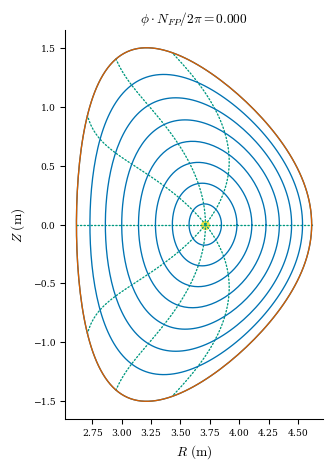

In [5]:
eq = get("DSHAPE")
plot_surfaces(eq);

In [6]:
model = VacuumGuidingCenterTrajectory(frame="flux")
rho = 0.4
N = 100
particles = ManualParticleInitializerFlux(
    rho0=[rho]*N,
    theta0=np.linspace(0, np.pi, N),
    zeta0=0,
    xi0=0.3,
    E=1e1, 
)
# particles = ManualParticleInitializerFlux(
#     rho0=[rho],
#     theta0=3*np.pi/4,
#     zeta0=0,
#     xi0=0.3,
#     E=1e1,
# )
# ts = np.linspace(0, 1e-2, 5000)
ts = np.linspace(0, 1e-4, 500)

In [8]:
# 3D plots use grid NFP=1 to plot all toroidal surfaces
with warnings.catch_warnings():
    warnings.simplefilter("ignore")
    fig = plot_3d(eq, "|B|", alpha=0.3)
fig = plot_particle_trajectories(
    eq,
    model,
    particles,
    ts=np.linspace(0, 1e-2, 5000),
    fig=fig,
    rtol=1e-3,
    atol=1e-3,
    max_steps=1_000,
)
fig

In [ ]:
# 3D plots use grid NFP=1 to plot all toroidal surfaces
with warnings.catch_warnings():
    warnings.simplefilter("ignore")
    fig = plot_3d(eq, "|B|", alpha=0.3)
for theta in np.linspace(0, np.pi, N):
    particles = ManualParticleInitializerFlux(
        rho0=[rho],
        theta0=theta,
        zeta0=0,
        xi0=0.3,
        E=1e1, 
    )
    fig = plot_particle_trajectories(
        eq,
        model,
        particles,
        ts=np.linspace(0, 1e-4, 500),
        max_steps=1_000,
        fig=fig,
        rtol=1e-3,
        atol=1e-3,
    )
fig

In [ ]:
eq = get("DSHAPE")
model = VacuumGuidingCenterTrajectory(frame="flux")
rho = 0.4
N = 3
ts = np.linspace(0, 1e-4, 500)

for theta in np.linspace(0, np.pi, N):
    particles = ManualParticleInitializerFlux(
        rho0=[rho],
        theta0=theta,
        zeta0=0,
        xi0=0.3,
        E=1e1, 
    )
    x, v, (stats, result) = trace_particles(
        field=eq,
        model=model,
        initializer=particles,
        ts=ts,
        rtol=1e-3,
        atol=1e-3,
        max_steps=1_000,
        return_aux=True,
    )
    print(f"theta={theta:.3f},  num_steps={stats["num_steps"]}")

In [ ]:
eq = get("DSHAPE")
model = VacuumGuidingCenterTrajectory(frame="flux")
rho = 0.4
N = 3
ts = np.linspace(0, 1e-4, 500)

particles = ManualParticleInitializerFlux(
    rho0=[rho],
    theta0=np.linspace(0, np.pi, N),
    zeta0=0,
    xi0=0.3,
    E=1e1,
)
x, v, (stats, result) = trace_particles(
    field=eq,
    model=model,
    initializer=particles,
    ts=ts,
    min_step_size=1e-6,
    rtol=1e-3,
    atol=1e-3,
    max_steps=1_000,
    throw=False,
    return_aux=True,
)
print(f"num_steps={stats["num_steps"]}")

In [ ]:
eq = get("DSHAPE")
model = VacuumGuidingCenterTrajectory(frame="flux")
rho = 0.4
N = 100
ts = np.linspace(0, 1e-4, 500)

particles = ManualParticleInitializerFlux(
    rho0=[rho],
    theta0=np.linspace(0, np.pi, N),
    zeta0=0,
    xi0=0.3,
    E=1e1,
)
x, v, (stats, result) = trace_particles(
    field=eq,
    model=model,
    initializer=particles,
    ts=ts,
    rtol=1e-3,
    atol=1e-3,
    max_steps=1_000,
    throw=False,
    return_aux=True,
)
print(f"num_steps={stats["num_steps"]}")

In [ ]:
y0, args = particles.init_particles(model, eq)
xp, yp, zeta, vpar = y0.T
args[:, 2]*10000000000000000

In [ ]:
from desc.particles import _compute_modB
coords = jnp.array([xp, yp, zeta])
modB = _compute_modB(coords.T, eq, eq.params_dict)
vperp2 = particles.v0**2 - vpar**2
particles.m * vperp2 / (2 * modB) * 10000000000000000

In [ ]:
coords = jnp.array([xp, yp, zeta]).T
grid = Grid(
    coords,
    spacing=jnp.zeros_like(coords),
    sort=False,
    NFP=eq.NFP,
    jitable=True,
)
profiles = get_profiles("|B|", eq, grid)
transforms = get_transforms("|B|", eq, grid, jitable=True)
compute_fun(
    eq,
    "|B|",
    params=eq.params_dict,
    grid=grid,
    profiles=profiles,
    transforms=transforms,
)["|B|"]

In [ ]:
plot_section(eq, "|B|");

In [ ]:
with warnings.catch_warnings():
    warnings.simplefilter("ignore")
    fig = plot_3d(eq, "|B|", alpha=0.3)


def to_lab(coords):
    grid = Grid(coords, jitable=True)
    return eq.compute("x", grid=grid)["x"]
rtz = x.copy()
x = vmap_chunked(to_lab, in_axes=(0,), chunk_size=500)(x)

for xi in x:
    xs = xi[:, 0] * np.cos(xi[:, 1])
    ys = xi[:, 0] * np.sin(xi[:, 1])
    zs = xi[:, 2]
    fig.add_trace(go.Scatter3d(x=xs, y=ys, z=zs, mode="lines"))
fig.show()

In [ ]:
import time

eq = get("DSHAPE")
model = VacuumGuidingCenterTrajectory(frame="flux")
rho = 0.4
N = 5
ts = np.linspace(0, 1e-4, 500)
particles = ManualParticleInitializerFlux(
    rho0=[rho],
    theta0=np.linspace(0, np.pi, N),
    zeta0=0,
    xi0=0.3,
    E=1e1,
)


def default_event(t, y, args, **kwargs):
    i = jnp.sqrt(y[0] ** 2 + y[1] ** 2)
    return jnp.logical_or(i < 0, i > 1)


# @jax.jit
def fun_no_jit(particles):
    x, v = trace_particles(
        field=eq,
        initializer=particles,
        model=model,
        ts=ts,
        params=eq.params_dict,
        max_steps=10000,
        min_step_size=1e-4,
        rtol=1e-3,
        atol=1e-3,
        solver=Tsit5(),
        adjoint=RecursiveCheckpointAdjoint(),
        chunk_size=None,
        options={},
        throw=True,
    )
    return x

t0 = time.time()
x = fun_no_jit(particles).block_until_ready()
print(time.time() - t0)
# %timeit fun_no_jit(particles).block_until_ready();

In [ ]:
from desc.particles import _trace_particles
import time

eq = get("DSHAPE")
model = VacuumGuidingCenterTrajectory(frame="flux")
rho = 0.4
N = 5
ts = np.linspace(0, 1e-4, 500)
particles = ManualParticleInitializerFlux(
    rho0=[rho],
    theta0=np.linspace(0, np.pi, N),
    zeta0=0,
    xi0=0.3,
    E=1e1,
)
def default_event(t, y, args, **kwargs):
    i = jnp.sqrt(y[0] ** 2 + y[1] ** 2)
    return jnp.logical_or(i < 0, i > 1)


@jax.jit
def fun_private(particles):
    x0, args = particles.init_particles(model, eq)
    x, v = _trace_particles(
        field=eq,
        y0=x0,
        model=model,
        model_args=args,
        ts=ts,
        params=eq.params_dict,
        max_steps=10000,
        min_step_size=1e-4,
        stepsize_controller=PIDController(rtol=1e-3, atol=1e-3, dtmin=1e-4),
        saveat=SaveAt(ts=ts),
        solver=Tsit5(),
        adjoint=RecursiveCheckpointAdjoint(),
        event=Event(default_event),
        chunk_size=None,
        options={},
        throw=True,
    )
    return x

t0 = time.time()
x = fun_private(particles).block_until_ready()
print(time.time() - t0)
%timeit fun_private(particles).block_until_ready();

In [ ]:
out = jax.vmap(
    _intfun_wrapper, in_axes=(0, 0) + 13 * (None,)
)(
    y0,
    model_args,
    field,
    params,
    ts,
    max_steps,
    min_step_size,
    solver,
    stepsize_controller,
    adjoint,
    event,
    model,
    saveat,
    options,
    throw,
)


def _intfun_wrapper(
    x,
    model_args,
    field,
    params,
    ts,
    max_steps,
    min_step_size,
    solver,
    stepsize_controller,
    adjoint,
    event,
    model,
    saveat,
    options,
    throw,
):
    """Wrapper for the integration function for vectorized inputs to prevent recompilation"""
    return diffeqsolve(
        terms=model,
        solver=solver,
        y0=x,
        args=[model_args, field, params, options],
        t0=ts[0],
        t1=ts[-1],
        saveat=saveat,
        max_steps=max_steps,
        dt0=min_step_size,
        stepsize_controller=stepsize_controller,
        adjoint=adjoint,
        event=event,
        throw=throw,
    ).ys
